<a href="https://colab.research.google.com/github/bnsreenu/python_for_microscopists/blob/master/330_Detectron2_Instance_3D_EM_Platelet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

https://youtu.be/cEgF0YknpZw

## Train custom instance segmentation model using Detectron2 - on your own dataset

Create your own dataset by annotating for object detection using your favorite annotation software that can export annotations as COCO JSON format. I have used https://www.makesense.ai/ for my tutorial. I used the polygon tool to annotate objects and exported annotations as, "Single file in COCO JSON format"

**Install Detectron2**

In [ ]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities (e.g. compiled operators).
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

In [ ]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

In [1]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
#from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

## Found here: https://gist.github.com/lalanikarim/df44bac00918ce8efdfc438c2d73592d

In [2]:
import numpy as np 
import cv2
# comment the original import from google.colab.patch
# from google.colab.patches import cv2_imshow 

# import pytplot from matplotlib if not already imported
import matplotlib.pyplot as plt

# for inline plot rendering
%matplotlib inline

def cv2_imshow(img):
    # set appropriate figure size in case it is too small or too large. Don't worry about it being square.
    plt.figure(figsize=(10,10))
    try:
        # try simple BGR 2 RGB conversion so pyplot can show the image
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    except:
        # this is for a special case in case the above doesn't work after applying convolutions
        plt.imshow(cv2.cvtColor(np.uint8(np.absolute(img)), cv2.COLOR_BGR2RGB))
    plt.show()

The default models are trained on natural images so let us go ahead and load a natural image to see if detectron is working. **We will run a pre-trained model on this image.**

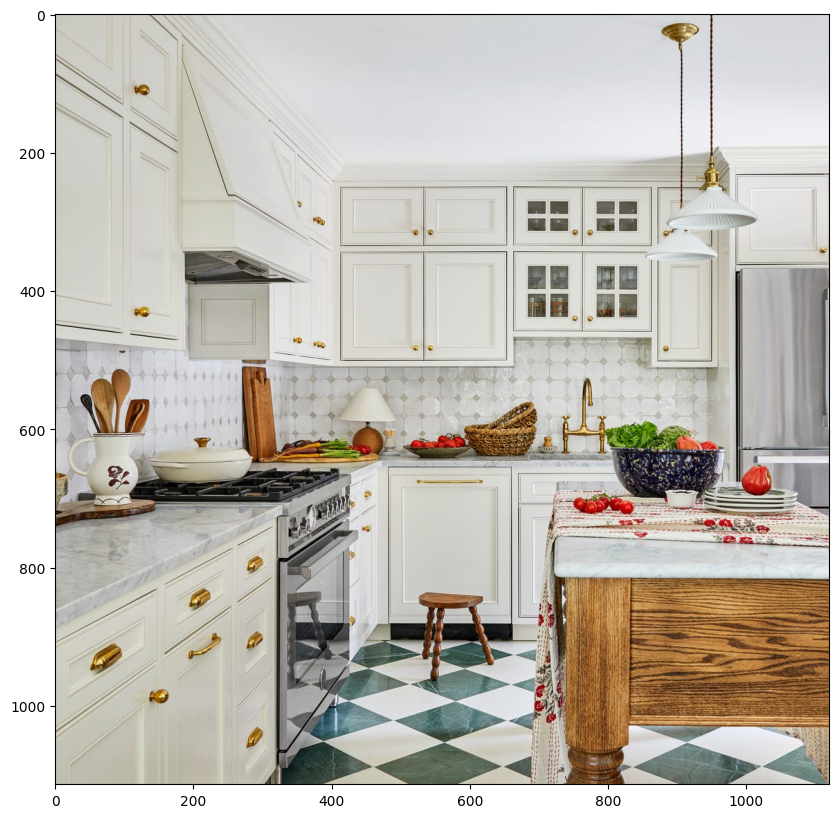

In [3]:
kitchen = cv2.imread("/tmp/kitchen.jpg")
cv2_imshow(kitchen)

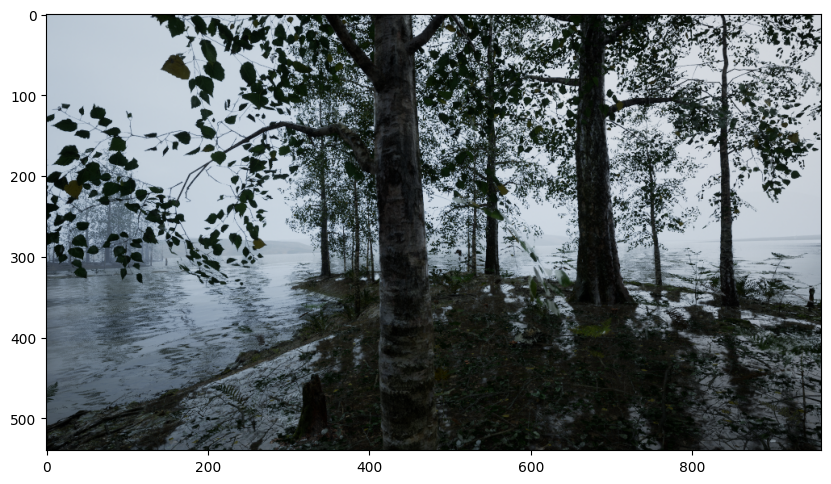

In [4]:
tree = cv2.imread('/mnt/raid1/dataset/spread/spread-v2/birch-forest/rgb/Tree10011_1720527021.png')
cv2_imshow(tree)

We create a detectron2 config and a detectron2 DefaultPredictor to run inference on this image.

In [5]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
# Find a model from detectron2's model zoo.  https://github.com/facebookresearch/detectron2/blob/main/MODEL_ZOO.md
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg)
outputs = predictor(kitchen)

[01/13 14:51:37 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl ...


/mnt/raid1/venvs/sam2/lib/python3.12/site-packages/torch/functional.py:534: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3595.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [6]:
# look at the outputs - tensors and bounding boxes.
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)

tensor([69, 56, 44, 44, 44, 41, 45, 44, 45, 60, 47, 58, 47, 47, 45, 71],
       device='cuda:0')
Boxes(tensor([[ 116.6453,  637.2147,  430.8270, 1010.1058],
        [ 525.0027,  833.6134,  636.6005,  966.0892],
        [  51.9174,  529.1649,   85.1272,  606.4354],
        [  81.8198,  512.8109,  110.2168,  603.2488],
        [  35.4041,  550.6329,   65.7012,  608.2216],
        [  19.8677,  607.1794,  129.7010,  709.5823],
        [ 803.1912,  618.3254,  970.5001,  709.4612],
        [ 101.0909,  558.5889,  134.0375,  606.4723],
        [ 508.7826,  619.7715,  604.3656,  642.9611],
        [ 724.1455,  689.5188, 1112.8317, 1104.6910],
        [ 429.5197,  596.7780,  475.8291,  637.3641],
        [ 792.1513,  592.7979,  965.3571,  708.0290],
        [ 551.3319,  608.8984,  593.3384,  628.9622],
        [ 993.4835,  651.3115, 1036.3945,  696.4927],
        [ 136.1659,  623.1018,  288.7059,  677.2688],
        [ 678.2644,  629.5678,  806.3510,  645.3940]], device='cuda:0'))


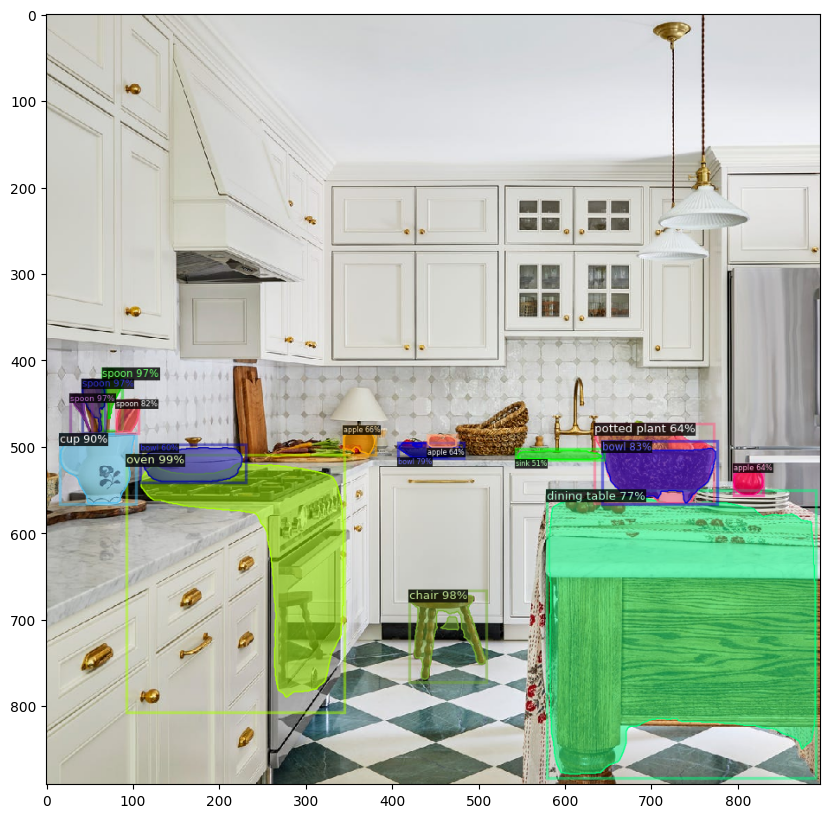

In [7]:
# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(kitchen[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=0.8)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

Now that we know the model is working on a natural image, let us test on a scientific image.

Let us make some predictions. Remember that the model mask_rcnn_R_50_FPN_3x has no idea about our sample and did not get trained on cells or mitochondria or on any scientific images.

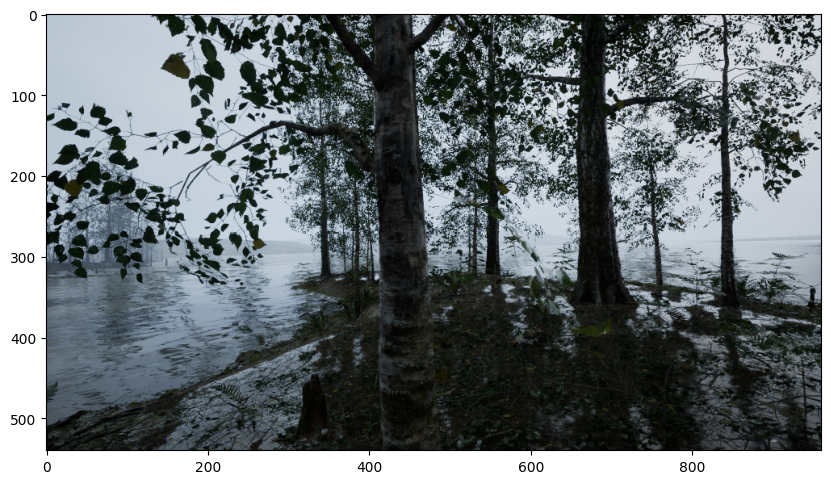

In [8]:
sci_outputs = predictor(tree)
sci_v = Visualizer(tree[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]))
sci_out = sci_v.draw_instance_predictions(sci_outputs["instances"].to("cpu"))
cv2_imshow(sci_out.get_image()[:, :, ::-1])

Of course, our cells are mislabeled as Tie, Pizza, etc. Let us train on a custom dataset.

# Train on a custom dataset

Import the necessary function to register datasets in the COCO format. Let us register both the training and validation datasets. Please note that we are working with training (and validation) data that is is the coco format where we have a single JSON file that describes all the annotations from all training images. <p>
Here, we are naming our training data as 'my_dataset_train' and the validation data as 'my_dataset_val'.



In [9]:
from detectron2.data.datasets import register_coco_instances
spread_dir = '/mnt/raid1/dataset/spread/spread-v2'
register_coco_instances("spread_train", {}, f"{spread_dir}/train.json", "/mnt/raid1/dataset/spread/spread-v2-coco")
register_coco_instances("spread_valid", {}, f"{spread_dir}/valid.json", "/mnt/raid1/dataset/spread/spread-v2-coco")
register_coco_instances("spread_test" , {}, f"{spread_dir}/test.json" , "/mnt/raid1/dataset/spread/spread-v2-coco")

Let us extract the metadata and dataset dictionaries for both training and validation datasets. These can be used later for other purposes, like visualization, model training, evaluation, etc. We will see a visualization example right away.

In [10]:
train_metadata      = MetadataCatalog.get("spread_train")
train_dataset_dicts = DatasetCatalog.get ("spread_train")

[01/13 14:51:52 d2.data.datasets.coco]: Loading /mnt/raid1/dataset/spread/spread-v2/train.json takes 13.60 seconds.
[01/13 14:51:52 d2.data.datasets.coco]: Loaded 8356 images in COCO format from /mnt/raid1/dataset/spread/spread-v2/train.json


In [11]:
val_metadata        = MetadataCatalog.get("spread_valid")
val_dataset_dicts   = DatasetCatalog.get ("spread_valid")

[01/13 14:52:00 d2.data.datasets.coco]: Loading /mnt/raid1/dataset/spread/spread-v2/valid.json takes 7.90 seconds.
[01/13 14:52:00 d2.data.datasets.coco]: Loaded 3042 images in COCO format from /mnt/raid1/dataset/spread/spread-v2/valid.json


In [12]:
test_metadata        = MetadataCatalog.get("spread_test")
test_dataset_dicts   = DatasetCatalog.get ("spread_test")

[01/13 14:52:03 d2.data.datasets.coco]: Loading /mnt/raid1/dataset/spread/spread-v2/test.json takes 2.76 seconds.
[01/13 14:52:03 d2.data.datasets.coco]: Loaded 1611 images in COCO format from /mnt/raid1/dataset/spread/spread-v2/test.json


In [13]:
from matplotlib import pyplot as plt
plt.rcParams["figure.figsize"] = (18,10)

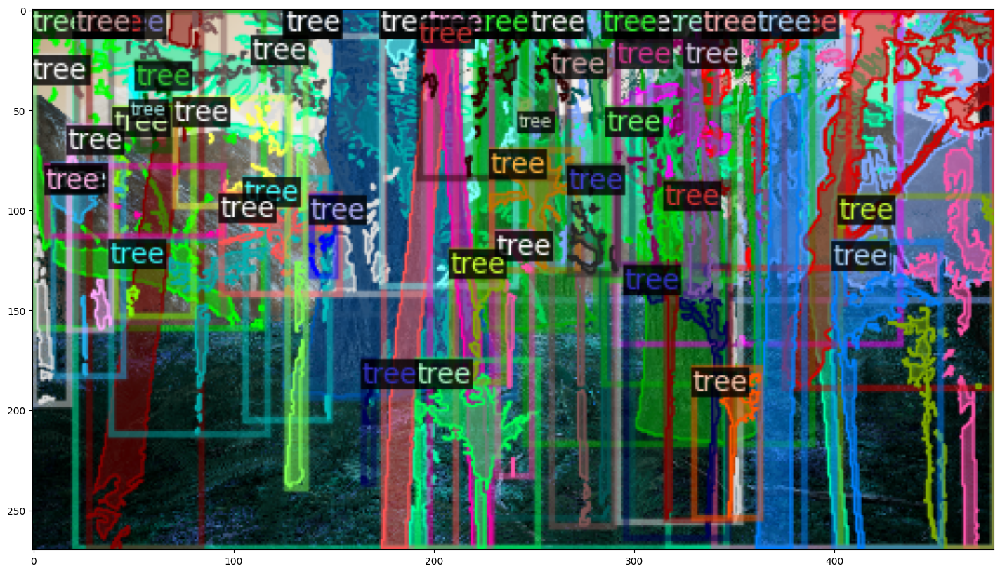

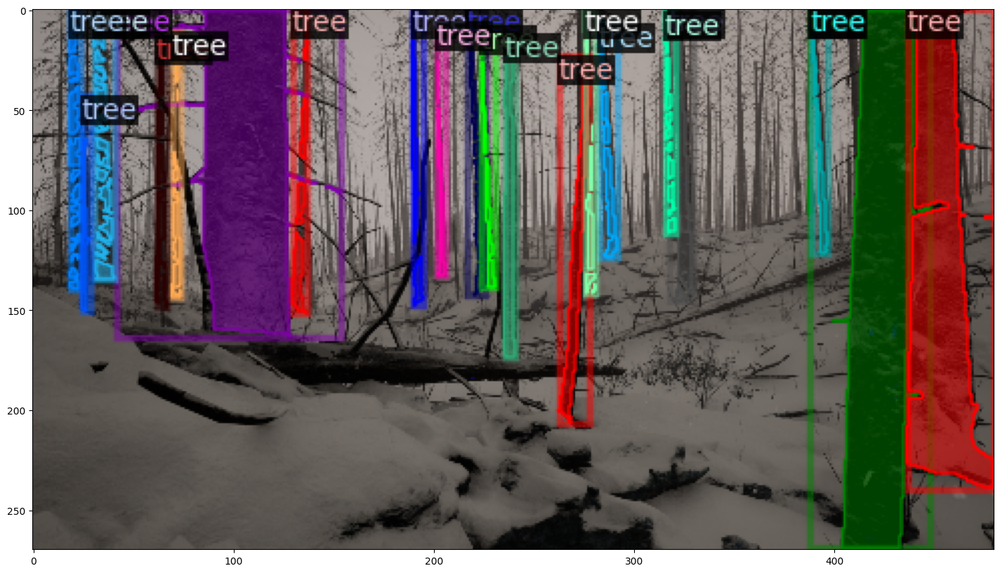

In [14]:
# Visualize some random samples
for d in random.sample(train_dataset_dicts, 2):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    plt.imshow(vis.get_image()[:, :, ::-1])
    plt.show(18,10)

# Train

Now we are ready to train a Mask R-CNN model using the Detectron2 library. We start by setting up a configuration file (.cfg) for the model. The configuration file contains many details including the output directory path, training dataset information, pre-trained weights, base learning rate, maximum number of iterations, etc.

In [17]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.OUTPUT_DIR      = "/mnt/raid1/repos/maskdino/maskdino-output"
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN  = ("spread_train",)
cfg.DATASETS.TEST   = ("spread_valid")
cfg.DATALOADER.NUM_WORKERS = 32
cfg.MODEL.WEIGHTS   = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 64  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR  = 0.01     # pick a good LR
cfg.SOLVER.MAX_ITER = 1000     # 1000 iterations seems good enough for this dataset
cfg.SOLVER.STEPS    = []       # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256   # Default is 512, using 256 for this dataset.
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # We have 1 classes.
# NOTE: this config means the number of classes, without the background. Do not use num_classes+1 here.

cfg.SOLVER.CHECKPOINT_PERIOD = 500
cfg.SOLVER.REFERENCE_WORLD_SIZE = 2 # for dataparallel hopefully

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) #Create an instance of of DefaultTrainer with the given congiguration
trainer.resume_or_load(resume=False) #Load a pretrained model if available (resume training) or start training from scratch if no pretrained model is available

[01/13 15:02:12 d2.engine.defaults]: Auto-scaling the config to batch_size=32, learning_rate=0.005, max_iter=2000, warmup=2000.
[01/13 15:02:13 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride

[01/13 15:02:29 d2.data.datasets.coco]: Loading /mnt/raid1/dataset/spread/spread-v2/train.json takes 15.89 seconds.
[01/13 15:02:29 d2.data.datasets.coco]: Loaded 8356 images in COCO format from /mnt/raid1/dataset/spread/spread-v2/train.json
[01/13 15:02:29 d2.data.build]: Removed 0 images with no usable annotations. 8356 images left.
[01/13 15:02:29 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in training: [ResizeShortestEdge(short_edge_length=(640, 672, 704, 736, 768, 800), max_size=1333, sample_style='choice'), RandomFlip()]
[01/13 15:02:29 d2.data.build]: Using training sampler TrainingSampler
[01/13 15:02:29 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[01/13 15:02:29 d2.data.common]: Serializing 8356 elements to byte tensors and concatenating them all ...
[01/13 15:02:31 d2.data.common]: Serialized dataset takes 551.69 MiB
[01/13 15:02:31 d2.data.build]: Making batched data loader with batch_size=32
[01/13 15

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (1, 256, 1, 1) in

Train

In [18]:
trainer.train() #Start the training process

[01/13 15:02:39 d2.engine.train_loop]: Starting training from iteration 0
[01/13 15:03:35 d2.utils.events]:  eta: 1:21:38  iter: 19  total_loss: 5.767  loss_cls: 0.6158  loss_box_reg: 0.5072  loss_mask: 0.6873  loss_rpn_cls: 3.299  loss_rpn_loc: 0.6721    time: 2.4667  last_time: 2.4832  data_time: 0.3759  last_data_time: 0.0514   lr: 5.2452e-05  max_mem: 30011M
[01/13 15:04:25 d2.utils.events]:  eta: 1:21:05  iter: 39  total_loss: 2.893  loss_cls: 0.5332  loss_box_reg: 0.7288  loss_mask: 0.6218  loss_rpn_cls: 0.4387  loss_rpn_loc: 0.5678    time: 2.4808  last_time: 2.4855  data_time: 0.0630  last_data_time: 0.0539   lr: 0.0001024  max_mem: 30011M
[01/13 15:05:15 d2.utils.events]:  eta: 1:20:23  iter: 59  total_loss: 2.707  loss_cls: 0.513  loss_box_reg: 0.7475  loss_mask: 0.5385  loss_rpn_cls: 0.3562  loss_rpn_loc: 0.5664    time: 2.4873  last_time: 2.5111  data_time: 0.0611  last_data_time: 0.0595   lr: 0.00015235  max_mem: 30011M
[01/13 15:06:05 d2.utils.events]:  eta: 1:19:52  iter

[01/13 15:26:35 d2.utils.events]:  eta: 1:00:52  iter: 559  total_loss: 2.074  loss_cls: 0.3882  loss_box_reg: 0.6911  loss_mask: 0.3176  loss_rpn_cls: 0.2265  loss_rpn_loc: 0.4495    time: 2.5524  last_time: 2.5444  data_time: 0.0724  last_data_time: 0.0475   lr: 0.0014011  max_mem: 30012M
[01/13 15:27:26 d2.utils.events]:  eta: 1:00:00  iter: 579  total_loss: 2.087  loss_cls: 0.392  loss_box_reg: 0.6789  loss_mask: 0.3149  loss_rpn_cls: 0.2181  loss_rpn_loc: 0.4727    time: 2.5511  last_time: 2.5506  data_time: 0.0636  last_data_time: 0.0552   lr: 0.0014511  max_mem: 30012M
[01/13 15:28:16 d2.utils.events]:  eta: 0:59:09  iter: 599  total_loss: 2.044  loss_cls: 0.3912  loss_box_reg: 0.6854  loss_mask: 0.3051  loss_rpn_cls: 0.2115  loss_rpn_loc: 0.4447    time: 2.5500  last_time: 2.5382  data_time: 0.0652  last_data_time: 0.0734   lr: 0.001501  max_mem: 30012M
[01/13 15:29:07 d2.utils.events]:  eta: 0:58:18  iter: 619  total_loss: 2.04  loss_cls: 0.3817  loss_box_reg: 0.672  loss_mask

[01/13 15:50:24 d2.utils.events]:  eta: 0:37:12  iter: 1119  total_loss: 1.997  loss_cls: 0.3725  loss_box_reg: 0.6482  loss_mask: 0.3013  loss_rpn_cls: 0.2112  loss_rpn_loc: 0.4457    time: 2.5507  last_time: 2.5064  data_time: 0.0639  last_data_time: 0.0436   lr: 0.0027997  max_mem: 30012M
[01/13 15:51:15 d2.utils.events]:  eta: 0:36:22  iter: 1139  total_loss: 1.998  loss_cls: 0.3725  loss_box_reg: 0.663  loss_mask: 0.3039  loss_rpn_cls: 0.207  loss_rpn_loc: 0.4417    time: 2.5505  last_time: 2.5557  data_time: 0.0617  last_data_time: 0.0517   lr: 0.0028497  max_mem: 30012M
[01/13 15:52:06 d2.utils.events]:  eta: 0:35:31  iter: 1159  total_loss: 2.001  loss_cls: 0.3741  loss_box_reg: 0.6683  loss_mask: 0.3072  loss_rpn_cls: 0.2103  loss_rpn_loc: 0.4421    time: 2.5506  last_time: 2.5910  data_time: 0.0661  last_data_time: 0.0614   lr: 0.0028996  max_mem: 30012M
[01/13 15:52:57 d2.utils.events]:  eta: 0:34:40  iter: 1179  total_loss: 1.987  loss_cls: 0.3693  loss_box_reg: 0.6592  los

[01/13 16:14:12 d2.utils.events]:  eta: 0:13:31  iter: 1679  total_loss: 1.908  loss_cls: 0.3518  loss_box_reg: 0.6485  loss_mask: 0.2872  loss_rpn_cls: 0.1973  loss_rpn_loc: 0.4263    time: 2.5496  last_time: 2.5461  data_time: 0.0672  last_data_time: 0.0597   lr: 0.0041983  max_mem: 30012M
[01/13 16:15:03 d2.utils.events]:  eta: 0:12:40  iter: 1699  total_loss: 1.927  loss_cls: 0.3582  loss_box_reg: 0.6551  loss_mask: 0.2853  loss_rpn_cls: 0.2078  loss_rpn_loc: 0.4294    time: 2.5494  last_time: 2.5639  data_time: 0.0602  last_data_time: 0.0572   lr: 0.0042483  max_mem: 30012M
[01/13 16:15:56 d2.utils.events]:  eta: 0:11:49  iter: 1719  total_loss: 1.952  loss_cls: 0.3585  loss_box_reg: 0.6535  loss_mask: 0.2944  loss_rpn_cls: 0.2061  loss_rpn_loc: 0.4347    time: 2.5506  last_time: 2.5161  data_time: 0.1960  last_data_time: 0.0854   lr: 0.0042982  max_mem: 30012M
[01/13 16:16:46 d2.utils.events]:  eta: 0:10:58  iter: 1739  total_loss: 1.937  loss_cls: 0.3538  loss_box_reg: 0.6438  l

KeyError: "Dataset 's' is not registered! Available datasets are: coco_2014_train, coco_2014_val, coco_2014_minival, coco_2014_valminusminival, coco_2017_train, coco_2017_val, coco_2017_test, coco_2017_test-dev, coco_2017_val_100, keypoints_coco_2014_train, keypoints_coco_2014_val, keypoints_coco_2014_minival, keypoints_coco_2014_valminusminival, keypoints_coco_2017_train, keypoints_coco_2017_val, keypoints_coco_2017_val_100, coco_2017_train_panoptic_separated, coco_2017_train_panoptic_stuffonly, coco_2017_train_panoptic, coco_2017_val_panoptic_separated, coco_2017_val_panoptic_stuffonly, coco_2017_val_panoptic, coco_2017_val_100_panoptic_separated, coco_2017_val_100_panoptic_stuffonly, coco_2017_val_100_panoptic, lvis_v1_train, lvis_v1_val, lvis_v1_test_dev, lvis_v1_test_challenge, lvis_v0.5_train, lvis_v0.5_val, lvis_v0.5_val_rand_100, lvis_v0.5_test, lvis_v0.5_train_cocofied, lvis_v0.5_val_cocofied, cityscapes_fine_instance_seg_train, cityscapes_fine_sem_seg_train, cityscapes_fine_instance_seg_val, cityscapes_fine_sem_seg_val, cityscapes_fine_instance_seg_test, cityscapes_fine_sem_seg_test, cityscapes_fine_panoptic_train, cityscapes_fine_panoptic_val, voc_2007_trainval, voc_2007_train, voc_2007_val, voc_2007_test, voc_2012_trainval, voc_2012_train, voc_2012_val, ade20k_sem_seg_train, ade20k_sem_seg_val, spread_train, spread_val, spread_test"

Save the config file, for potential future use

In [29]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 2067781), started 0:06:22 ago. (Use '!kill 2067781' to kill it.)

In [28]:
import yaml
from datetime import datetime

outdir = '/mnt/raid1/repos/maskdino/MaskDINO/configs/spread/Detectron2_Models/'
os.makedirs(outdir, exist_ok=True)

now = datetime.now().strftime('%Y%m%d-%H%M%S')

# Save the configuration to a config.yaml file
# Save the configuration to a config.yaml file
config_yaml_path = f"{outdir}/config-{now}.yaml"
with open(config_yaml_path, 'w') as file:
    yaml.dump(cfg, file)

# Inference & evaluation using the trained model

In [30]:
trainer.test(cfg, trainer.model)

WARNING [01/13 16:44:14 d2.data.build]: The following dataset names are not registered in the DatasetCatalog: {'s'}. Available datasets are KeysView(DatasetCatalog(registered datasets: coco_2014_train, coco_2014_val, coco_2014_minival, coco_2014_valminusminival, coco_2017_train, coco_2017_val, coco_2017_test, coco_2017_test-dev, coco_2017_val_100, keypoints_coco_2014_train, keypoints_coco_2014_val, keypoints_coco_2014_minival, keypoints_coco_2014_valminusminival, keypoints_coco_2017_train, keypoints_coco_2017_val, keypoints_coco_2017_val_100, coco_2017_train_panoptic_separated, coco_2017_train_panoptic_stuffonly, coco_2017_train_panoptic, coco_2017_val_panoptic_separated, coco_2017_val_panoptic_stuffonly, coco_2017_val_panoptic, coco_2017_val_100_panoptic_separated, coco_2017_val_100_panoptic_stuffonly, coco_2017_val_100_panoptic, lvis_v1_train, lvis_v1_val, lvis_v1_test_dev, lvis_v1_test_challenge, lvis_v0.5_train, lvis_v0.5_val, lvis_v0.5_val_rand_100, lvis_v0.5_test, lvis_v0.5_train

KeyError: "Dataset 's' is not registered! Available datasets are: coco_2014_train, coco_2014_val, coco_2014_minival, coco_2014_valminusminival, coco_2017_train, coco_2017_val, coco_2017_test, coco_2017_test-dev, coco_2017_val_100, keypoints_coco_2014_train, keypoints_coco_2014_val, keypoints_coco_2014_minival, keypoints_coco_2014_valminusminival, keypoints_coco_2017_train, keypoints_coco_2017_val, keypoints_coco_2017_val_100, coco_2017_train_panoptic_separated, coco_2017_train_panoptic_stuffonly, coco_2017_train_panoptic, coco_2017_val_panoptic_separated, coco_2017_val_panoptic_stuffonly, coco_2017_val_panoptic, coco_2017_val_100_panoptic_separated, coco_2017_val_100_panoptic_stuffonly, coco_2017_val_100_panoptic, lvis_v1_train, lvis_v1_val, lvis_v1_test_dev, lvis_v1_test_challenge, lvis_v0.5_train, lvis_v0.5_val, lvis_v0.5_val_rand_100, lvis_v0.5_test, lvis_v0.5_train_cocofied, lvis_v0.5_val_cocofied, cityscapes_fine_instance_seg_train, cityscapes_fine_sem_seg_train, cityscapes_fine_instance_seg_val, cityscapes_fine_sem_seg_val, cityscapes_fine_instance_seg_test, cityscapes_fine_sem_seg_test, cityscapes_fine_panoptic_train, cityscapes_fine_panoptic_val, voc_2007_trainval, voc_2007_train, voc_2007_val, voc_2007_test, voc_2012_trainval, voc_2012_train, voc_2012_val, ade20k_sem_seg_train, ade20k_sem_seg_val, spread_train, spread_val, spread_test"

In [31]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[01/13 16:44:35 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /mnt/raid1/repos/maskdino/maskdino-output/model_final.pth ...


/mnt/raid1/venvs/sam2/lib/python3.12/site-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f, map_location=torch.dev

Verify segmentation on random validation images

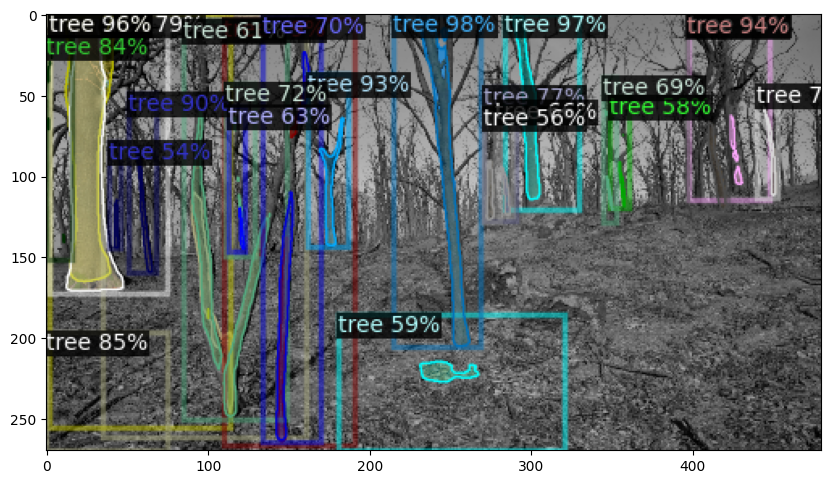

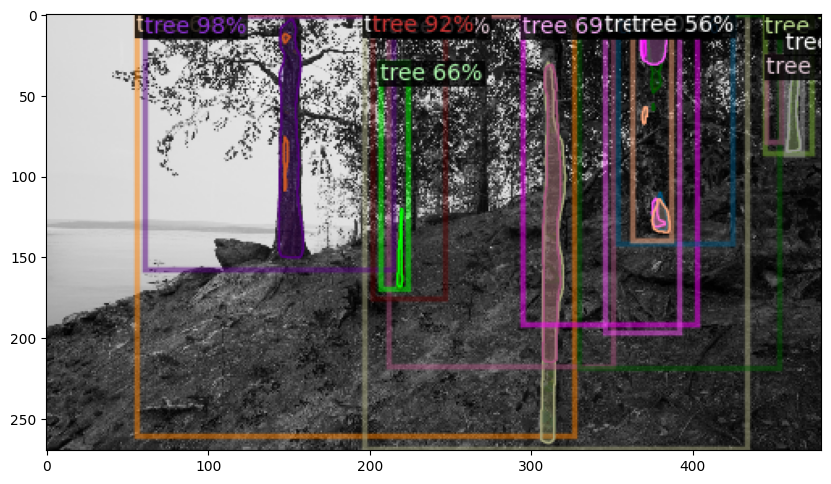

In [34]:
from detectron2.utils.visualizer import ColorMode

for d in random.sample(val_dataset_dicts, 2):    #select number of images for display
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=val_metadata,
                   scale=0.5,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

Check average precision and recall. (Need more validation data than just 2 images with handful of annotations)

In [36]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("spread_valid", output_dir=cfg.OUTPUT_DIR)
val_loader = build_detection_test_loader(cfg, "spread_valid")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[01/13 16:49:01 d2.data.datasets.coco]: Loading /mnt/raid1/dataset/spread/spread-v2/valid.json takes 4.88 seconds.
[01/13 16:49:02 d2.data.datasets.coco]: Loaded 3042 images in COCO format from /mnt/raid1/dataset/spread/spread-v2/valid.json
[01/13 16:49:07 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|    tree    | 126271       |
|            |              |
[01/13 16:49:07 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[01/13 16:49:07 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[01/13 16:49:07 d2.data.common]: Serializing 3042 elements to byte tensors and concatenating them all ...
[01/13 16:49:18 d2.data.common]: Serialized dataset takes 242.05 MiB
[01/13 16:49:19 d2.evaluation.evaluator]: Start inference on 3042 batches
[01/13 16:4

Loading and preparing results...
DONE (t=0.25s)
creating index...
index created!
[01/13 16:51:36 d2.evaluation.fast_eval_api]: Evaluate annotation type *segm*
[01/13 16:51:47 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 11.08 seconds.
[01/13 16:51:47 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[01/13 16:51:47 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.09 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.022
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.054
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.016
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.001
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.036
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.124
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.007
 Aver

**Load a new image and segment it.**

In [47]:
os.makedirs('/tmp/trees', exist_ok=True)

In [48]:
!wget 'https://www.sciencefriday.com/wp-content/uploads/2021/12/Forest-trees.jpg' --output-document='/tmp/trees/Forest-trees.jpg'

--2025-01-13 17:06:14--  https://www.sciencefriday.com/wp-content/uploads/2021/12/Forest-trees.jpg
Resolving www.sciencefriday.com (www.sciencefriday.com)... 192.0.66.159, 2a04:fa87:fffd::c000:429f
Connecting to www.sciencefriday.com (www.sciencefriday.com)|192.0.66.159|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2359367 (2.2M) [image/jpeg]
Saving to: ‘/tmp/trees/Forest-trees.jpg’

/tmp/trees/Forest-t 100%[===================>]   2.25M  7.51MB/s    in 0.3s    

2025-01-13 17:06:14 (7.51 MB/s) - ‘/tmp/trees/Forest-trees.jpg’ saved [2359367/2359367]



In [49]:
def detectron2_predict(fn):
    new_im = cv2.imread(fn)
    outputs  = predictor(new_im)

    # We can use `Visualizer` to draw the predictions on the image.
    v = Visualizer(new_im[:, :, ::-1], metadata=train_metadata)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

    cv2_imshow(out.get_image()[:, :, ::-1])

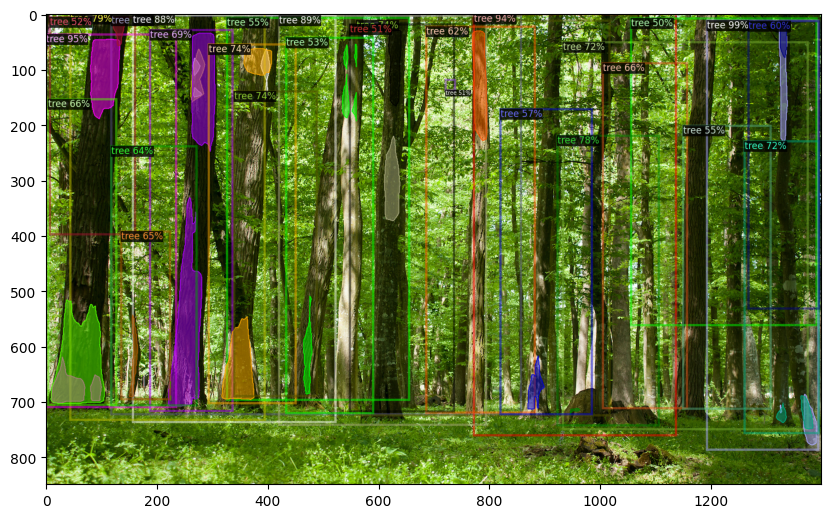

In [50]:
detectron2_predict(fn='/tmp/trees/Forest-trees.jpg')

--2025-01-13 17:06:20--  https://onetreeplanted.org/cdn/shop/files/black-forest-germany-1634665542362.jpg
Resolving onetreeplanted.org (onetreeplanted.org)... 23.227.38.32
Connecting to onetreeplanted.org (onetreeplanted.org)|23.227.38.32|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 668616 (653K) [image/jpeg]
Saving to: ‘/tmp/trees/black-forest-germany.jpg’

/tmp/trees/black-fo 100%[===================>] 652.95K  --.-KB/s    in 0.07s   

2025-01-13 17:06:20 (9.46 MB/s) - ‘/tmp/trees/black-forest-germany.jpg’ saved [668616/668616]



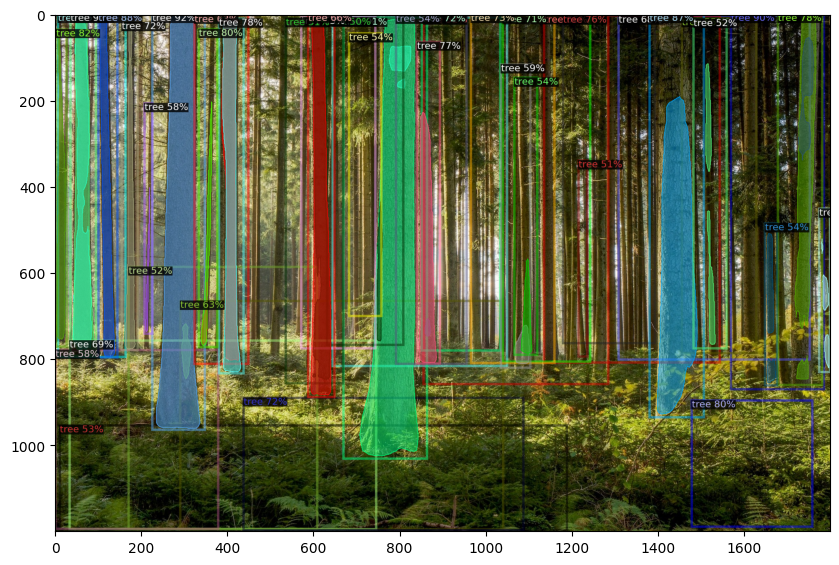

In [51]:
fn='/tmp/trees/black-forest-germany.jpg'
!wget 'https://onetreeplanted.org/cdn/shop/files/black-forest-germany-1634665542362.jpg' --output-document={fn}
detectron2_predict(fn=fn)

--2025-01-13 17:06:26--  https://onetreeplanted.org/cdn/shop/files/forest-in-the-rain-1634665541988.webp
Resolving onetreeplanted.org (onetreeplanted.org)... 23.227.38.32
Connecting to onetreeplanted.org (onetreeplanted.org)|23.227.38.32|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 519362 (507K) [image/jpeg]
Saving to: ‘/tmp/trees/forest-in-the-rain.webp’

/tmp/trees/forest-i 100%[===================>] 507.19K  --.-KB/s    in 0.06s   

2025-01-13 17:06:27 (7.84 MB/s) - ‘/tmp/trees/forest-in-the-rain.webp’ saved [519362/519362]



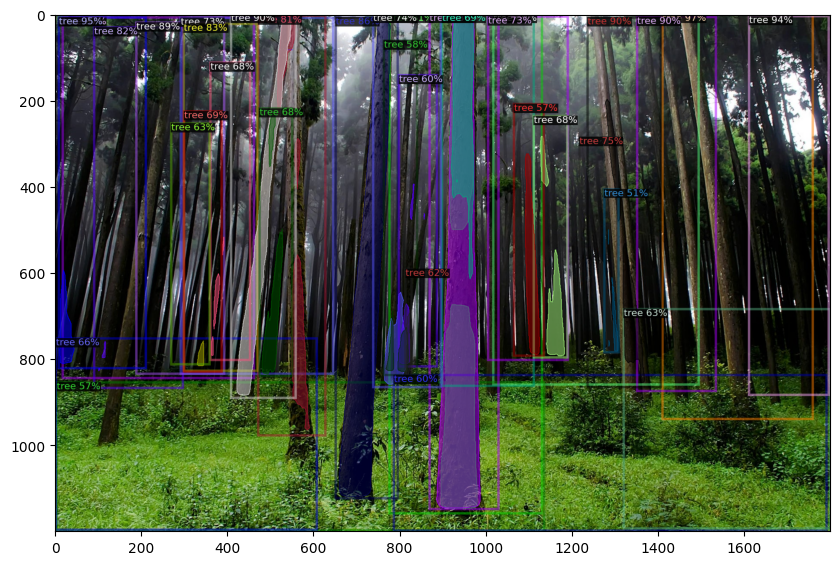

In [52]:
fn='/tmp/trees/forest-in-the-rain.webp'
!wget 'https://onetreeplanted.org/cdn/shop/files/forest-in-the-rain-1634665541988.webp' --output-document={fn}
detectron2_predict(fn=fn)

--2025-01-13 17:06:35--  https://www.nycgovparks.org/pagefiles/201/great-trees-banner__66fd87f0e849b.jpg
Resolving www.nycgovparks.org (www.nycgovparks.org)... 98.85.75.120, 34.200.3.35, 34.228.163.119
Connecting to www.nycgovparks.org (www.nycgovparks.org)|98.85.75.120|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2057733 (2.0M) [image/jpeg]
Saving to: ‘/tmp/trees/great-trees-in-nyc.jpg’

/tmp/trees/great-tr 100%[===================>]   1.96M  1.89MB/s    in 1.0s    

2025-01-13 17:06:36 (1.89 MB/s) - ‘/tmp/trees/great-trees-in-nyc.jpg’ saved [2057733/2057733]



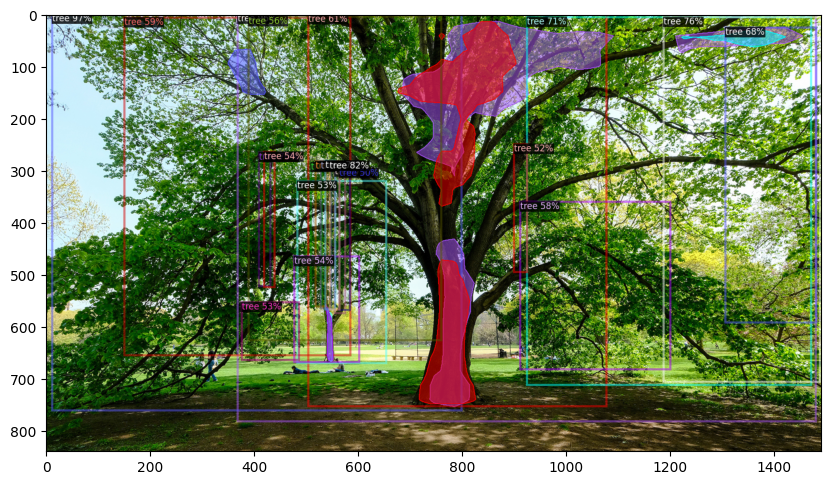

In [53]:
fn='/tmp/trees/great-trees-in-nyc.jpg'
!wget 'https://www.nycgovparks.org/pagefiles/201/great-trees-banner__66fd87f0e849b.jpg' --output-document={fn}
detectron2_predict(fn=fn)

--2025-01-13 17:07:52--  https://images.squarespace-cdn.com/content/v1/5cb3ca007a1fbd45aeff89ea/08d79b2d-21b5-41e9-9c52-1c14aaf2de34/nashville-tree-conservation-corps-how-trees-benefit-ecosystem-winter.jpg
Resolving images.squarespace-cdn.com (images.squarespace-cdn.com)... 151.101.0.238, 151.101.192.238, 151.101.64.238, ...
Connecting to images.squarespace-cdn.com (images.squarespace-cdn.com)|151.101.0.238|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 274501 (268K) [image/jpeg]
Saving to: ‘/tmp/trees/tree-in-winter.jpg’

/tmp/trees/tree-in- 100%[===================>] 268.07K  --.-KB/s    in 0.03s   

2025-01-13 17:07:52 (9.97 MB/s) - ‘/tmp/trees/tree-in-winter.jpg’ saved [274501/274501]



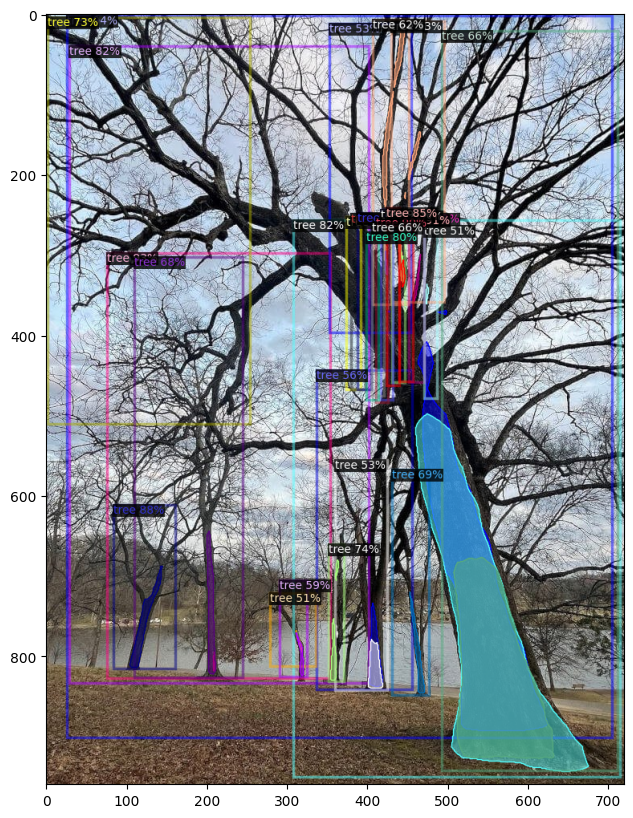

In [54]:
fn='/tmp/trees/tree-in-winter.jpg'
!wget 'https://images.squarespace-cdn.com/content/v1/5cb3ca007a1fbd45aeff89ea/08d79b2d-21b5-41e9-9c52-1c14aaf2de34/nashville-tree-conservation-corps-how-trees-benefit-ecosystem-winter.jpg' --output-document={fn}
detectron2_predict(fn=fn)

--2025-01-13 17:09:57--  https://www.arboroperations.com.au/wp-content/uploads/2021/08/american-elm.jpg
Resolving www.arboroperations.com.au (www.arboroperations.com.au)... 54.253.233.167
Connecting to www.arboroperations.com.au (www.arboroperations.com.au)|54.253.233.167|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1076645 (1.0M) [image/jpeg]
Saving to: ‘/tmp/trees/american-elm.jpg’

/tmp/trees/american 100%[===================>]   1.03M   480KB/s    in 2.2s    

2025-01-13 17:10:00 (480 KB/s) - ‘/tmp/trees/american-elm.jpg’ saved [1076645/1076645]



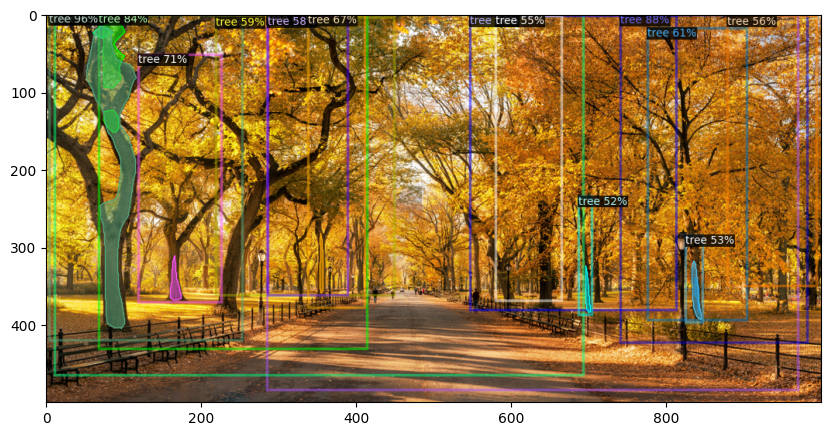

In [57]:
fn='/tmp/trees/american-elm.jpg'
!wget --user-agent='Mozilla 5.0' 'https://www.arboroperations.com.au/wp-content/uploads/2021/08/american-elm.jpg' --output-document={fn}
detectron2_predict(fn=fn)

--2025-01-13 17:12:24--  https://mothertreeproject.org/wp-content/uploads/2019/12/bill_web_still-image-test00086400_1-1.jpg
Resolving mothertreeproject.org (mothertreeproject.org)... 198.50.124.194
Connecting to mothertreeproject.org (mothertreeproject.org)|198.50.124.194|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 686185 (670K) [image/jpeg]
Saving to: ‘/tmp/trees/large-trees.jpg’

/tmp/trees/large-tr 100%[===================>] 670.10K   767KB/s    in 0.9s    

2025-01-13 17:12:25 (767 KB/s) - ‘/tmp/trees/large-trees.jpg’ saved [686185/686185]



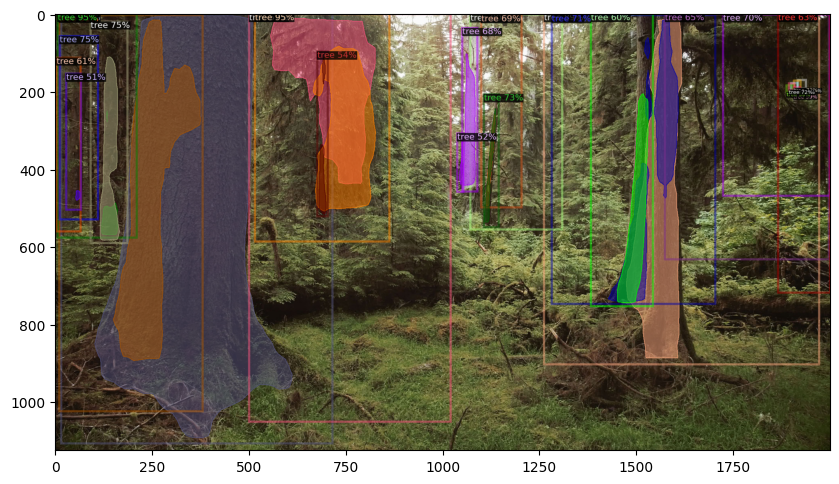

In [58]:
fn='/tmp/trees/large-trees.jpg'
!wget 'https://mothertreeproject.org/wp-content/uploads/2019/12/bill_web_still-image-test00086400_1-1.jpg' --output-document={fn}
detectron2_predict(fn=fn)

**Process multiple images in a directory and save the results in an output directory**

In [62]:
# Directory path to the input images folder
input_images_directory = "/tmp/trees"

# Output directory where the segmented images will be saved
output_directory = "/tmp/trees/results"  # Replace this with the path to your desired output directory
os.makedirs(output_directory, exist_ok=True)

# Loop over the images in the input folder
for image_filename in os.listdir(input_images_directory):
    image_path = os.path.join(input_images_directory, image_filename)
    if os.path.isdir(image_path):
        continue
    print(f'Reading image: {image_path}')
    new_im = cv2.imread(image_path)

    # Perform prediction on the new image
    outputs = predictor(new_im)  # Format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format

    # We can use `Visualizer` to draw the predictions on the image.
    v = Visualizer(new_im[:, :, ::-1], metadata=train_metadata)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

    # Create the output filename with _result extension
    result_filename = os.path.splitext(image_filename)[0] + "_result.png"
    output_path = os.path.join(output_directory, result_filename)

    # Save the segmented image
    cv2.imwrite(output_path, out.get_image()[:, :, ::-1])

print("Segmentation of all images completed.")

Reading image: /tmp/trees/Forest-trees.jpg
Reading image: /tmp/trees/black-forest-germany.jpg
Reading image: /tmp/trees/forest-in-the-rain.webp
Reading image: /tmp/trees/great-trees-in-nyc.jpg
Reading image: /tmp/trees/tree-in-winter.jpg
Reading image: /tmp/trees/american-elm.jpg
Reading image: /tmp/trees/large-trees.jpg
Segmentation of all images completed.



**Segment images and save object level information into a csv file.**




In [65]:
import csv
from skimage.measure import regionprops, label


# Assuming you have already defined the 'predictor' object and loaded the model.
# Also, make sure 'metadata' is defined appropriately.

# Directory path to the input images folder
input_images_directory = "/tmp/trees"

# Output directory where the CSV file will be saved
output_directory = "/tmp/trees/results"
output_csv_path  = f"{output_directory}/output_objects.csv"  # Replace this with the path to your desired output CSV file

# Open the CSV file for writing
with open(output_csv_path, 'w', newline='') as csvfile:
    csvwriter = csv.writer(csvfile)

    # Write the header row in the CSV file
    csvwriter.writerow(["File Name", "Class Name", "Object Number", "Area", "Centroid", "BoundingBox"])  # Add more columns as needed for other properties

    # Loop over the images in the input folder
    for image_filename in os.listdir(input_images_directory):
        image_path = os.path.join(input_images_directory, image_filename)
        if os.path.isdir(image_path):
            continue
        print(f'Reading image: {image_path}')
        new_im = cv2.imread(image_path)

        # Perform prediction on the new image
        outputs = predictor(new_im)  # Format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format

        # Convert the predicted mask to a binary mask
        mask = outputs["instances"].pred_masks.to("cpu").numpy().astype(bool)

        # Get the predicted class labels
        class_labels = outputs["instances"].pred_classes.to("cpu").numpy()

        # Debugging: print class_labels and metadata.thing_classes
        #print("Class Labels:", class_labels)
        #print("Thing Classes:", train_metadata.thing_classes)

        # Use skimage.measure.regionprops to calculate object parameters
        labeled_mask = label(mask)
        props = regionprops(labeled_mask)

        # Write the object-level information to the CSV file
        for i, prop in enumerate(props):
            object_number = i + 1  # Object number starts from 1
            area = prop.area
            centroid = prop.centroid
            bounding_box = prop.bbox

            # Check if the corresponding class label exists
            if i < len(class_labels):
                class_label = class_labels[i]
                class_name = train_metadata.thing_classes[class_label]
            else:
                # If class label is not available (should not happen), use 'Unknown' as class name
                class_name = 'Unknown'

            # Write the object-level information to the CSV file
            csvwriter.writerow([image_filename, class_name, object_number, area, centroid, bounding_box])  # Add more columns as needed for other properties

print("Object-level information saved to CSV file.")

Reading image: /tmp/trees/Forest-trees.jpg
Reading image: /tmp/trees/black-forest-germany.jpg
Reading image: /tmp/trees/forest-in-the-rain.webp
Reading image: /tmp/trees/great-trees-in-nyc.jpg
Reading image: /tmp/trees/tree-in-winter.jpg
Reading image: /tmp/trees/american-elm.jpg
Reading image: /tmp/trees/large-trees.jpg
Object-level information saved to CSV file.


**Generate plots to understand the objects**

/tmp/ipykernel_2063391/853894170.py:23: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x="Class Name", y="Object Number", data=avg_objects_per_class, ci=None, order=class_names)


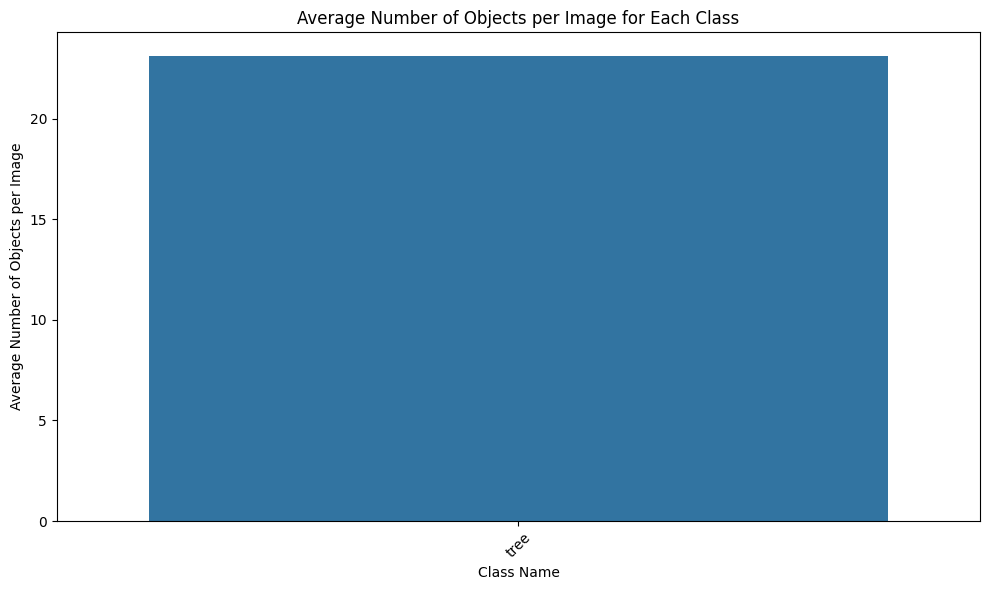

/tmp/ipykernel_2063391/853894170.py:37: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x="Class Name", y="Area", data=avg_area_per_class, ci=None, order=class_names)


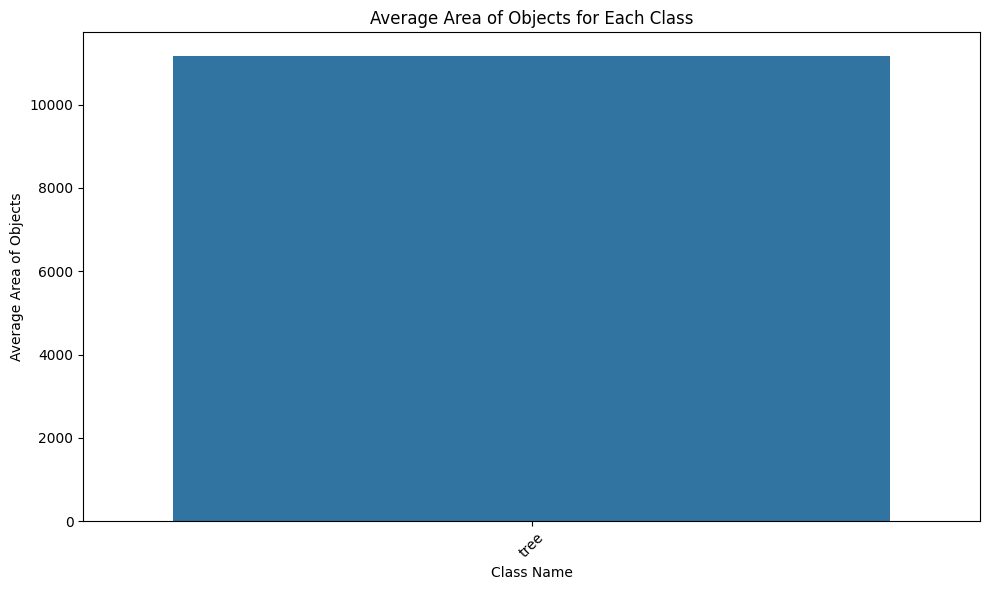

In [66]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Output directory where the CSV file will be saved
output_directory = "/tmp/trees/results"
csv_file_path    = f"{output_directory}/output_objects.csv"  # Replace this with the path to your desired output CSV file

# Load the CSV file into a pandas DataFrame
df = pd.read_csv(csv_file_path)

# Get class names from train_metadata.thing_classes
class_names = train_metadata.thing_classes

# Group the data by both "File Name" and "Class Name" and calculate the average number of objects per image for each class
# first group the data by both "File Name" and "Class Name" and count the number of objects within each group.
#Then, group the data by "Class Name" only and calculate the mean of the counts, which gives us the average number of objects per image for each class.
avg_objects_per_class = df.groupby(["File Name", "Class Name"])["Object Number"].count().reset_index()
avg_objects_per_class = avg_objects_per_class.groupby("Class Name")["Object Number"].mean().reset_index()

# Plot: Average number of objects per image for each class
plt.figure(figsize=(10, 6))
sns.barplot(x="Class Name", y="Object Number", data=avg_objects_per_class, ci=None, order=class_names)
plt.xticks(rotation=45)
plt.xlabel("Class Name")
plt.ylabel("Average Number of Objects per Image")
plt.title("Average Number of Objects per Image for Each Class")
plt.tight_layout()
plt.show()


# Group the data by class and calculate the average area of objects for each class
avg_area_per_class = df.groupby("Class Name")["Area"].mean().reset_index()

# Plot: Average area of objects for each class
plt.figure(figsize=(10, 6))
sns.barplot(x="Class Name", y="Area", data=avg_area_per_class, ci=None, order=class_names)
plt.xticks(rotation=45)
plt.xlabel("Class Name")
plt.ylabel("Average Area of Objects")
plt.title("Average Area of Objects for Each Class")
plt.tight_layout()
plt.show()

**Saving binary (actually multinary) images for each class for further processing.** Here, for each input image we will save n images corresponding to the number of classes. In our example, we will save 4 images for each image corresponding to the 4 classes. Each of these images will contain objects numbered 1, 2, 3, etc. - basically instance segmentation like images. These images can be used for further downstream processing.

In [68]:
import os
import cv2
import numpy as np
import torch
from detectron2.utils.visualizer import Visualizer

# Directory path to the input images folder
input_images_directory = "/tmp/trees"

# Output directory where the segmented images will be saved
output_directory = "/tmp/trees/results/instances"
os.makedirs(output_directory, exist_ok=True)

# Loop over the images in the input folder
for image_filename in os.listdir(input_images_directory):
    image_path = os.path.join(input_images_directory, image_filename)
    if os.path.isdir(image_path):
        continue
    print(f'Reading image: {image_path}')
    new_im = cv2.imread(image_path)

    # Perform prediction on the new image
    outputs = predictor(new_im)  # Format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format

    # Create a dictionary to store the mask for each class with unique integer labels
    class_masks = {class_name: torch.zeros_like(outputs["instances"].pred_masks[0], dtype=torch.uint8, device=torch.device("cuda:0"))
                   for class_name in train_metadata.thing_classes}

    # Assign a unique integer label to each object in the mask
    for i, pred_class in enumerate(outputs["instances"].pred_classes):
        class_name = train_metadata.thing_classes[pred_class]
        class_masks[class_name] = torch.where(outputs["instances"].pred_masks[i].to(device=torch.device("cuda:0")),
                                              i + 1,
                                              class_masks[class_name])

    # Save the masks for each class with unique integer labels
    for class_name, class_mask in class_masks.items():
        # Convert the tensor to a NumPy array and then to a regular (CPU) array
        class_mask_np = class_mask.cpu().numpy()

        # Create the output filename with _class_name_result.png extension
        class_filename = os.path.splitext(image_filename)[0] + f"_{class_name}_result.png"
        class_output_path = os.path.join(output_directory, class_filename)

        # Save the image with unique integer labels
        cv2.imwrite(class_output_path, class_mask_np.astype(np.uint8))

print("Segmentation of all images completed.")

Reading image: /tmp/trees/Forest-trees.jpg
Reading image: /tmp/trees/black-forest-germany.jpg
Reading image: /tmp/trees/forest-in-the-rain.webp
Reading image: /tmp/trees/great-trees-in-nyc.jpg
Reading image: /tmp/trees/tree-in-winter.jpg
Reading image: /tmp/trees/american-elm.jpg
Reading image: /tmp/trees/large-trees.jpg
Segmentation of all images completed.
